
 
**Dataset:** Indoor Scene Recognition

**Fontes:**

* http://web.mit.edu/torralba/www/indoor.html
* https://github.com/ashrutkumar/Indoor-scene-recognition

**Evaluation Set:** 
* https://web.mit.edu/torralba/www/TrainingImages.txt
* https://web.mit.edu/torralba/www/TestImages.txt

In [ ]:
import os
import pandas as pd

# Download Data

In [ ]:
# Training Set
!wget http://groups.csail.mit.edu/vision/LabelMe/NewImages/indoorCVPR_09.tar

# Evaluating Set
#!wget https://web.mit.edu/torralba/www/TrainingImages.txt
#!wget https://web.mit.edu/torralba/www/TestImages.txt

--2022-05-24 21:45:18--  http://groups.csail.mit.edu/vision/LabelMe/NewImages/indoorCVPR_09.tar
Resolving groups.csail.mit.edu (groups.csail.mit.edu)... 128.30.2.44
Connecting to groups.csail.mit.edu (groups.csail.mit.edu)|128.30.2.44|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2592010240 (2.4G) [application/x-tar]
Saving to: ‘indoorCVPR_09.tar’

indoorCVPR_09.tar   100%[===================>]   2.41G  13.3MB/s    in 3m 14s  

2022-05-24 21:48:33 (12.7 MB/s) - ‘indoorCVPR_09.tar’ saved [2592010240/2592010240]



In [ ]:
!tar -xvf ./indoorCVPR_09.tar

Streaming output truncated to the last 5000 lines.
Images/mall/cover_home3.jpg
Images/mall/CP67791.jpg
Images/mall/crocker_galleria_735089.jpg
Images/mall/mall1.jpg
Images/mall/d8.jpg
Images/mall/deira_city_centre_dubai_08.jpg
Images/mall/dungarv_new_mall.jpg
Images/mall/latham_circle_mall_16.jpg
Images/mall/eastridg1.jpg
Images/mall/IMG_6449.jpg
Images/mall/main_boutique_b.jpg
Images/mall/easyfranchise_centre_commercial_1.jpg
Images/mall/ins42.jpg
Images/mall/mall14.jpg
Images/mall/eaton_centre_2001_03.jpg
Images/mall/ins43.jpg
Images/mall/mall17.jpg
Images/mall/full_shopping_Central_1.jpg
Images/mall/galleria.jpg
Images/mall/galleria1.jpg
Images/mall/galleria2.jpg
Images/mall/Galleria_003.jpg
Images/mall/laurel_mall_06.jpg
Images/mall/Galleria_1.jpg
Images/mall/galleria_san_federico_nr_109_2_n1.jpg
Images/mall/ins23.jpg
Images/mall/ins44.jpg
Images/mall/mall18.jpg
Images/mall/galleria_vittorio_emanuele_ii_milan_mlgalar.jpg
Images/mall/ins45.jpg
Images/mall/mall19.jpg
Images/mall/GUM_

In [ ]:
## GROUPS CHECKING
groups = {
  "Store":["bakery", "grocerystore", "clothingstore", "deli", "laundromat", "jewelleryshop", "bookstore", "videostore", "florist", "shoeshop", "mall", "toystore"],
  "Home":["bedroom", "nursery", "closet", "pantry", "children_room", "lobby", "dining_room", "corridor", "livingroom", "bathroom", "kitchen"],
  "Public spaces":["prisoncell", "library", "cloister", "church_inside", "waitingroom", "museum", "elevator", "subway", "locker_room", "trainstation", "airport_inside"],
  "Leisure":["buffet", "fastfood_restaurant", "concert_hall", "restaurant", "bar", "movietheater", "gameroom", "casino", "bowling", "gym", "hairsalon"],
  "Working place":["hospitalroom", "kindergarden", "restaurant", "kitchen", "artstudio", "classroom", "laboratorywet", "studiomusic", "operating_room", "office", "computerroom", "warehouse", "greenhouse", "dentaloffice", "tv_studio", "meeting_room"]
 }

# for group in groups.keys():
#  for category in groups[group]:
#    if category in list(labeldict.keys()):
#      pass
#    else:
#      print(category)

In [ ]:
!rm -rf /Images

In [ ]:
files=[x.split("/")[-1]for x in [x[0] for x in os.walk("Images")][1:]]
files.sort()
labeldict={}
count=0

for file in files:
    labeldict[file]=count
    count+=1
    
from collections import defaultdict
class_freq=defaultdict(int)
csvlist=[]

for file in files:
    images=os.listdir(os.path.join(os.getcwd() + "/Images",file))
    count=1
    for img in images:
        an=img.split(".")        
        newname=str(file)+"_"+str(count)+"."+str(an[-1])
        os.rename(os.path.join(os.getcwd() + "/Images",file,img),os.path.join(os.getcwd() + "/Images",newname))
        csvlist.append([file, labeldict[file],newname])
        class_freq[file]+=1
        count+=1
        
for file in files:
    os.rmdir(os.path.join(os.getcwd() + "/Images",file))

df = pd.DataFrame(csvlist,columns=["Category", "Category_Id","File"]) 
df.to_csv("Train.csv")
#!mv Train.csv ../Train.csv

In [ ]:
df["Weight"] = df["Category"].map(df["Category"].value_counts(normalize = True))

In [ ]:
df

,Category,Category_Id,File,Weight
0,airport_inside,0,airport_inside_1.jpg,0.038924
1,airport_inside,0,airport_inside_2.jpg,0.038924
2,airport_inside,0,airport_inside_3.jpg,0.038924
3,airport_inside,0,airport_inside_4.jpg,0.038924
4,airport_inside,0,airport_inside_5.jpg,0.038924
...,...,...,...,...
15615,winecellar,66,winecellar_265.jpg,0.017222
15616,winecellar,66,winecellar_266.jpg,0.017222
15617,winecellar,66,winecellar_267.jpg,0.017222
15618,winecellar,66,winecellar_268.jpg,0.017222


# Dataset

In [ ]:
import pandas as pd
import numpy as np
import os
import torch
import glob
import random
import copy
import matplotlib.pyplot as plt
from math import floor
import uuid
%matplotlib inline 

In [ ]:
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms
from torch.utils.data import Dataset,SubsetRandomSampler,Sampler
from torch import nn
import torch.nn.functional as F
from torch import optim

In [ ]:
from skimage import io, transform
from PIL import Image
import PIL.ImageEnhance as ie
import PIL.Image as im
from torch.autograd import Variable

In [ ]:
#from google.colab import files,drive

In [ ]:
class ImageDataset(Dataset): 
    
    def __init__(self, csv_file, root_dir, transform=None):
        self.data_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        # Id = File
        # Category = Category_Id
        img_name = os.path.join(self.root_dir, self.data_frame['File'][idx])         
        image = Image.open(img_name).convert('RGB')                               
        label = np.array(self.data_frame['Category_Id'][idx])                        
        if self.transform:            
            image = self.transform(image)                                         
        sample = (image, label) 
        return sample

In [ ]:
idx = 9
img_name = os.path.join('./Images', df['File'][idx]) 
img = Image.open(img_name).convert('RGB')

In [ ]:
testando_transf = transforms.Compose([
        transforms.RandomResizedCrop(224)])

In [ ]:
transform_augmented = transforms.Compose([
        transforms.RandomResizedCrop(28),
        #PowerPIL(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                     ])
transform_raw = transforms.Compose([
                     transforms.Resize((224,224)),
                     transforms.ToTensor(),
                     transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])]) # https://stackoverflow.com/questions/58151507/why-pytorch-officially-use-mean-0-485-0-456-0-406-and-std-0-229-0-224-0-2

transformation = transforms.Compose([
                     transforms.Resize((28,28)),
                     transforms.ToTensor()])

In [ ]:
trainset = ImageDataset(csv_file = 'Train.csv', root_dir = './Images', transform=transform_augmented)
valset   = ImageDataset(csv_file = 'Train.csv', root_dir = './Images', transform=transform_raw)
accset   = ImageDataset(csv_file = 'Train.csv', root_dir = './Images', transform=transform_raw)

In [ ]:
entendimento = ImageDataset(csv_file = 'Train.csv', root_dir = './Images', transform = transformation)

In [ ]:
trainloader = torch.utils.data.DataLoader(entendimento, batch_size=500, shuffle=True)

# GAN Implementation
Adapted from [Buiding a Simple Vanilla GAN with Pytorch](https://github.com/christianversloot/machine-learning-articles/blob/main/building-a-simple-vanilla-gan-with-pytorch.md)

In [ ]:
# Configurable variables
NUM_EPOCHS = 50
NOISE_DIMENSION = 50
BATCH_SIZE = 128
TRAIN_ON_GPU = True
UNIQUE_RUN_ID = str(uuid.uuid4())
PRINT_STATS_AFTER_BATCH = 50
OPTIMIZER_LR = 0.0002
OPTIMIZER_BETAS = (0.5, 0.999)
GENERATOR_OUTPUT_IMAGE_SHAPE = 3 * 28 * 28

In [ ]:
# Speed ups
torch.autograd.set_detect_anomaly(False)
torch.autograd.profiler.profile(False)
torch.autograd.profiler.emit_nvtx(False)
torch.backends.cudnn.benchmark = True

In [ ]:
class Generator(nn.Module):
  """
    Vanilla GAN Generator
  """
  def __init__(self,):
    super().__init__()
    self.layers = nn.Sequential(
      # First upsampling
      nn.Linear(NOISE_DIMENSION, 128, bias=False),
      nn.BatchNorm1d(128, 0.8),
      nn.LeakyReLU(0.25),
      # Second upsampling
      nn.Linear(128, 256, bias=False),
      nn.BatchNorm1d(256, 0.8),
      nn.LeakyReLU(0.25),
      # Third upsampling
      nn.Linear(256, 512, bias=False),
      nn.BatchNorm1d(512, 0.8),
      nn.LeakyReLU(0.25),
      # Final upsampling
      nn.Linear(512, GENERATOR_OUTPUT_IMAGE_SHAPE, bias=False),
      nn.Tanh()
    )

  def forward(self, x):
    """Forward pass"""
    return self.layers(x)

In [ ]:
class Discriminator(nn.Module):
  """
    Vanilla GAN Discriminator
  """
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
      nn.Linear(GENERATOR_OUTPUT_IMAGE_SHAPE, 1024), 
      nn.LeakyReLU(0.25),
      nn.Linear(1024, 512), 
      nn.LeakyReLU(0.25),
      nn.Linear(512, 256), 
      nn.LeakyReLU(0.25),
      nn.Linear(256, 1),
      nn.Sigmoid()
    )

  def forward(self, x):
    """Forward pass"""
    return self.layers(x)

In [ ]:
def get_device():
  """ Retrieve device based on settings and availability. """
  return torch.device("cuda:0" if torch.cuda.is_available() and TRAIN_ON_GPU else "cpu")
    
    
def make_directory_for_run():
  """ Make a directory for this training run. """
  print(f'Preparing training run {UNIQUE_RUN_ID}')
  if not os.path.exists('./runs'):
    os.mkdir('./runs')
  os.mkdir(f'./runs/{UNIQUE_RUN_ID}')


def generate_image(generator, epoch = 0, batch = 0, device=get_device()):
  """ Generate subplots with generated examples. """
  images = []
  noise = generate_noise(BATCH_SIZE, device=device)
  generator.eval()
  images = generator(noise)
  plt.figure(figsize=(10, 10))
  for i in range(16):
    # Get image
    image = images[i]
    # Convert image back onto CPU and reshape
    transform = transforms.ToPILImage()
    image = transform(image.reshape(3,28,28))
    # Plot
    plt.subplot(4, 4, i+1)
    plt.imshow(image)
    plt.axis('off')
  if not os.path.exists(f'./runs/{UNIQUE_RUN_ID}/images'):
    os.mkdir(f'./runs/{UNIQUE_RUN_ID}/images')
  plt.savefig(f'./runs/{UNIQUE_RUN_ID}/images/epoch{epoch}_batch{batch}.jpg')


def save_models(generator, discriminator, epoch):
  """ Save models at specific point in time. """
  torch.save(generator.state_dict(), f'./runs/{UNIQUE_RUN_ID}/generator_{epoch}.pth')
  torch.save(discriminator.state_dict(), f'./runs/{UNIQUE_RUN_ID}/discriminator_{epoch}.pth')


def print_training_progress(batch, generator_loss, discriminator_loss):
  """ Print training progress. """
  print('Losses after mini-batch %5d: generator %e, discriminator %e' %
        (batch, generator_loss, discriminator_loss))

In [ ]:
def prepare_dataset():
  """ Prepare dataset through DataLoader """
  # Prepare MNIST dataset
  dataset = ImageDataset(csv_file = 'Train.csv', root_dir = './Images', transform = transformation)
  # dataset = MNIST(os.getcwd(), download=True, train=True, transform=transforms.Compose([
  #   transforms.ToTensor(),
  #   transforms.Normalize((0.5,), (0.5,))
  # ]))
  # Batch and shuffle data with DataLoader
  trainloader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
  # Return dataset through DataLoader
  return trainloader

In [ ]:
def initialize_models(device = get_device()):
  """ Initialize Generator and Discriminator models """
  generator = Generator()
  discriminator = Discriminator()
  # Move models to specific device
  generator.to(device)
  discriminator.to(device)
  # Return models
  return generator, discriminator


def initialize_loss():
  """ Initialize loss function. """
  return nn.BCELoss()


def initialize_optimizers(generator, discriminator):
  """ Initialize optimizers for Generator and Discriminator. """
  generator_optimizer = torch.optim.AdamW(generator.parameters(), lr=OPTIMIZER_LR,betas=OPTIMIZER_BETAS)
  discriminator_optimizer = torch.optim.AdamW(discriminator.parameters(), lr=OPTIMIZER_LR,betas=OPTIMIZER_BETAS)
  return generator_optimizer, discriminator_optimizer

In [ ]:
def generate_noise(number_of_images = 1, noise_dimension = NOISE_DIMENSION, device=None):
  """ Generate noise for number_of_images images, with a specific noise_dimension """
  return torch.randn(number_of_images, noise_dimension, device=device)


def efficient_zero_grad(model):
  """ 
    Apply zero_grad more efficiently
    Source: https://betterprogramming.pub/how-to-make-your-pytorch-code-run-faster-93079f3c1f7b
  """
  for param in model.parameters():
    param.grad = None


def forward_and_backward(model, data, loss_function, targets):
  """
    Perform forward and backward pass in a generic way. Returns loss value.
  """
  outputs = model(data)
  error = loss_function(outputs, targets)
  error.backward()
  return error.item()

In [ ]:
def perform_train_step(generator, discriminator, real_data, \
  loss_function, generator_optimizer, discriminator_optimizer, device = get_device()):
  """ Perform a single training step. """
  
  # 1. PREPARATION
  # Set real and fake labels.
  real_label, fake_label = 1.0, 0.0
  # Get images on CPU or GPU as configured and available
  # Also set 'actual batch size', whih can be smaller than BATCH_SIZE
  # in some cases.
  real_images = real_data[0].to(device)
  actual_batch_size = real_images.size(0)
  label = torch.full((actual_batch_size,1), real_label, device=device)
  
  # 2. TRAINING THE DISCRIMINATOR
  # Zero the gradients for discriminator
  efficient_zero_grad(discriminator)
  # Forward + backward on real images, reshaped
  real_images = real_images.view(real_images.size(0), -1)
  error_real_images = forward_and_backward(discriminator, real_images, \
    loss_function, label)
  # Forward + backward on generated images
  noise = generate_noise(actual_batch_size, device=device)
  generated_images = generator(noise)
  label.fill_(fake_label)
  error_generated_images =forward_and_backward(discriminator, \
    generated_images.detach(), loss_function, label)
  # Optim for discriminator
  discriminator_optimizer.step()
  
  # 3. TRAINING THE GENERATOR
  # Forward + backward + optim for generator, including zero grad
  efficient_zero_grad(generator)
  label.fill_(real_label)
  error_generator = forward_and_backward(discriminator, generated_images, loss_function, label)
  generator_optimizer.step()
  
  # 4. COMPUTING RESULTS
  # Compute loss values in floats for discriminator, which is joint loss.
  error_discriminator = error_real_images + error_generated_images
  # Return generator and discriminator loss so that it can be printed.
  return error_generator, error_discriminator

In [ ]:
def perform_epoch(dataloader, generator, discriminator, loss_function, \
    generator_optimizer, discriminator_optimizer, epoch):
  """ Perform a single epoch. """
  for batch_no, real_data in enumerate(dataloader, 0):
    # Perform training step
    generator_loss_val, discriminator_loss_val = perform_train_step(generator, \
      discriminator, real_data, loss_function, \
      generator_optimizer, discriminator_optimizer)
    # Print statistics and generate image after every n-th batch
    if batch_no % PRINT_STATS_AFTER_BATCH == 0:
      print_training_progress(batch_no, generator_loss_val, discriminator_loss_val)
      generate_image(generator, epoch, batch_no)
  # Save models on epoch completion.
  save_models(generator, discriminator, epoch)
  # Clear memory after every epoch
  torch.cuda.empty_cache()

Preparing training run bfd9063c-ca72-4877-83ec-5ec663302983
Starting epoch 0...
Losses after mini-batch     0: generator 7.155949e-01, discriminator 1.380537e+00
Losses after mini-batch    50: generator 6.311488e-01, discriminator 1.431074e+00
Losses after mini-batch   100: generator 6.735312e-01, discriminator 1.618104e+00
Starting epoch 1...
Losses after mini-batch     0: generator 5.619312e-01, discriminator 1.401843e+00
Losses after mini-batch    50: generator 7.950177e-01, discriminator 1.292689e+00
Losses after mini-batch   100: generator 6.414415e-01, discriminator 1.419227e+00
Starting epoch 2...
Losses after mini-batch     0: generator 6.942995e-01, discriminator 1.277470e+00
Losses after mini-batch    50: generator 1.016838e+00, discriminator 1.244209e+00
Losses after mini-batch   100: generator 1.051046e+00, discriminator 1.078342e+00
Starting epoch 3...
Losses after mini-batch     0: generator 9.744579e-01, discriminator 1.188159e+00
Losses after mini-batch    50: generator

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Starting epoch 7...
Losses after mini-batch     0: generator 7.067407e-01, discriminator 1.310172e+00
Losses after mini-batch    50: generator 1.332261e+00, discriminator 1.150845e+00
Losses after mini-batch   100: generator 9.284935e-01, discriminator 1.220017e+00
Starting epoch 8...
Losses after mini-batch     0: generator 8.824793e-01, discriminator 1.231489e+00
Losses after mini-batch    50: generator 1.003086e+00, discriminator 1.082639e+00
Losses after mini-batch   100: generator 1.380532e+00, discriminator 1.059957e+00
Starting epoch 9...
Losses after mini-batch     0: generator 2.552561e+00, discriminator 1.475982e+00
Losses after mini-batch    50: generator 8.489475e-01, discriminator 1.227456e+00
Losses after mini-batch   100: generator 1.078330e+00, discriminator 1.241348e+00
Starting epoch 10...
Losses after mini-batch     0: generator 7.745489e-01, discriminator 1.403967e+00
Losses after mini-batch    50: generator 1.263487e+00, discriminator 1.238136e+00
Losses after mini

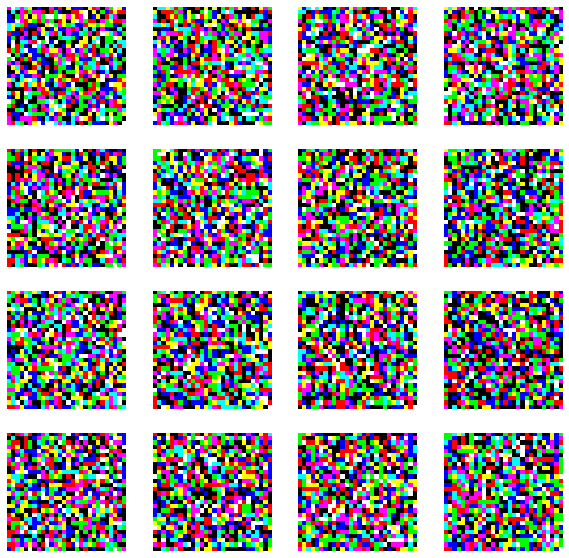

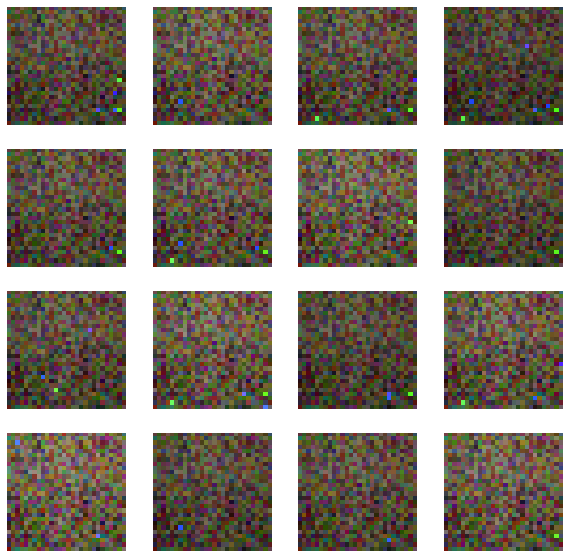

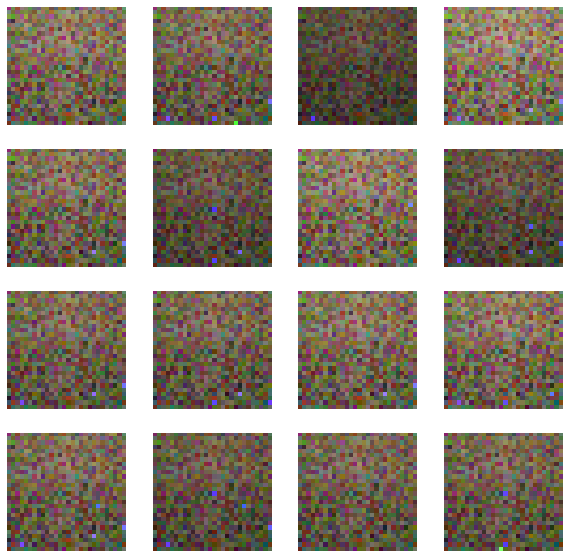

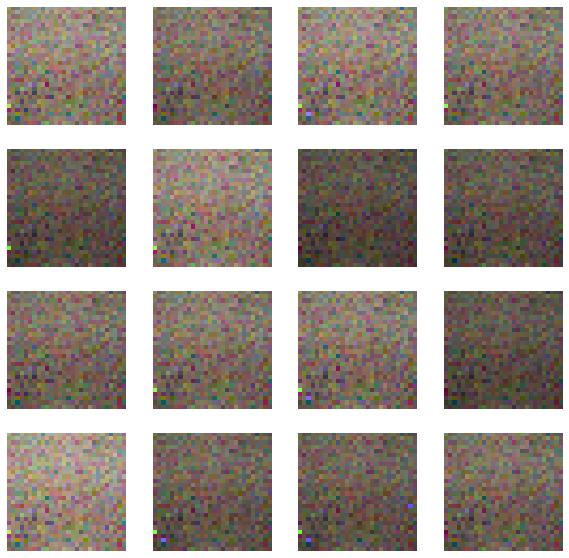

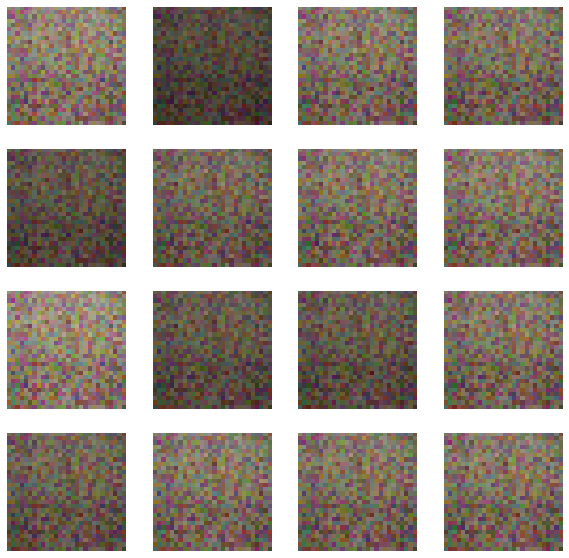

...

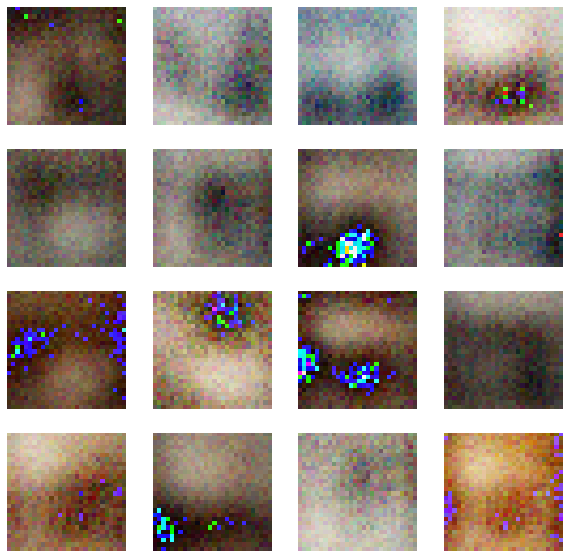

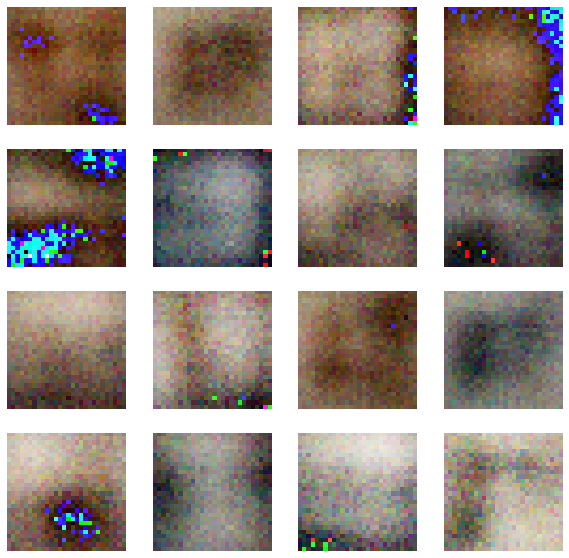

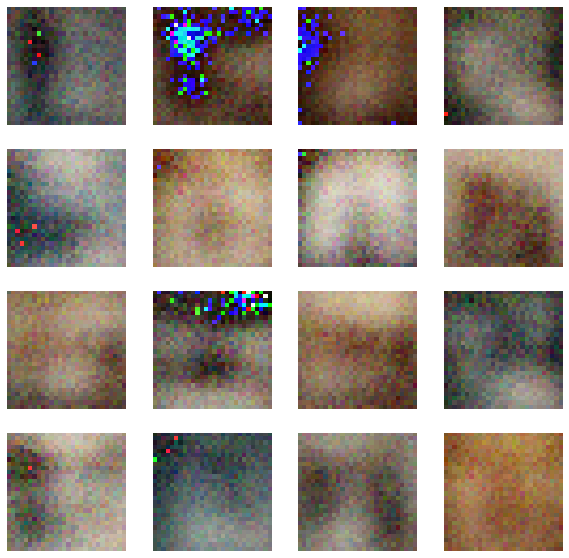

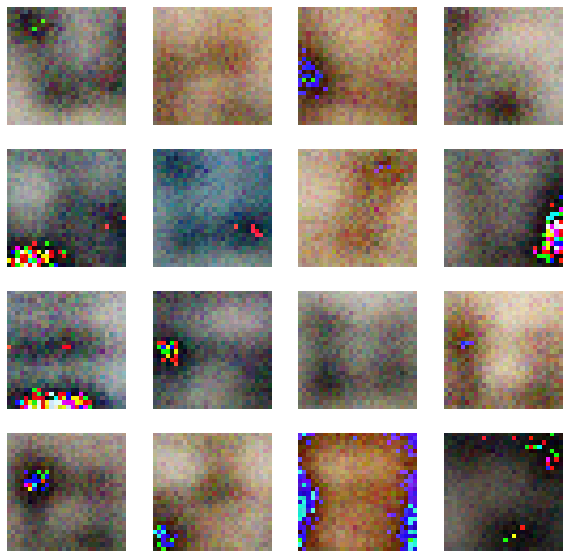

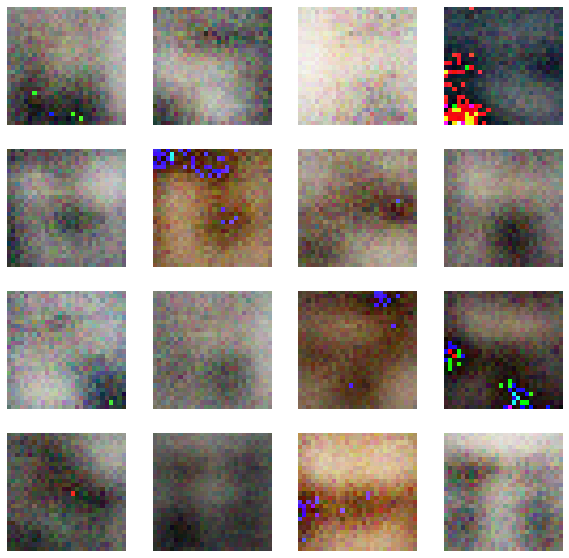

In [ ]:
def train_gan():
  """ Train the GAN. """
  # Make directory for unique run
  make_directory_for_run()
  # Set fixed random number seed
  torch.manual_seed(42)
  # Get prepared dataset
  dataloader = prepare_dataset()
  # Initialize models
  generator, discriminator = initialize_models()
  # Initialize loss and optimizers
  loss_function = initialize_loss()
  generator_optimizer, discriminator_optimizer = initialize_optimizers(generator, discriminator)
  # Train the model
  for epoch in range(NUM_EPOCHS):
    print(f'Starting epoch {epoch}...')
    perform_epoch(dataloader, generator, discriminator, loss_function, \
      generator_optimizer, discriminator_optimizer, epoch)
  # Finished :-)
  print(f'Finished unique run {UNIQUE_RUN_ID}')


if __name__ == '__main__':
  train_gan()

In [ ]:
# def generate_image(dataloader):
#   """ Generate subplots with generated examples. """
#   plt.figure(figsize=(10, 10))
#   for data in dataloader:
#     # for i in range(16):
#     for i in range(2):
#       # Get image
#       image = data[0][i]
#       print(image.shape)
#       # Convert image back onto CPU and reshape
#       transform = transforms.ToPILImage()
#       image = transform(image)
#       # Plot
#       plt.subplot(4, 4, i+1)
#       plt.imshow(image)
#       plt.axis('off')
#     plt.savefig(f'images_.jpg')

# dataloader = prepare_dataset()
# generate_image(dataloader)